In [1]:
from IPython.core.display import HTML
# Apply styles globally within the notebook
HTML('''
<style>
  h2 {
    font-size: var(--j3p-content-font-size4);
    background-color:#D2691E  ;
    color: white;
    display: flex;
    align-items: center;
    justify-content: center;
    padding: 10px 41px;
    top: 10px;
    position: relative;
    border-radius: 10px 50px 10px 50px;
}

 img {       /* flex-grow: 1; */
            /* flex-shrink: 1; */
            border-radius: 100px 70px 150px 70px; 
            border: 10px solid #eee;
            display: flex;
            align-items: center;
            justify-content: center;
            transition: box-shadow 0.3s ease; /* Add a transition for a smooth effect */
        }

       img:active {
          box-shadow: 0 10px 20px rgba(255, 255, 0, 0.5), 0 6px 6px rgba(215, 215, 0, 0.5);
        }
</style>
''')   

## House Price Prediction

<img src="https://media.istockphoto.com/id/1066106810/photo/house-real-estate-graph-price-investment-mortgage.jpg?s=2048x2048&w=is&k=20&c=xC1Pb7SchKFU9IqydCxYnRw9ypOmnJX8QEnnp5bzySU=" alt="My Image">

## Table of Contents 

<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

   
    
    
<p> &bull;        <a target="_blank"> Introudction</a>  </p> 

<p> &bull;      <a target="_blank"> Explantory Data Analysis</a>  </p>

<p>&bull;       <a target="_blank"> Data Processing</a>  </p>

<p>&bull;       <a target="_blank"> Model Bulding</a> </p>   
    
<p>&bull;       <a target="_blank"> Evalution Metrics </a> </p> 

<p>&bull;       <a target="_blank"> Results & see the best models </a> </p>   

</div>

## Data Information

<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">


<p>&bull;The real estate markets, like those in Sydney and Melbourne, present an interesting opportunity for data analysts to analyze and predict where property prices are moving towards.  </p> 

<p>&bull;Prediction of property prices is becoming increasingly important and beneficial.</p>

<p>&bull;Property prices are a good indicator of both the overall market condition and the economic health of a country.</p>

<p>&bull;Considering the data provided, we are wrangling a large set of property sales records stored in an unknown format and with unknown data quality issues </p> 
    
</div>

## Understand the problem :








<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; This problem Consider as Regression problrm   .</p> 

<p> &bull; Target of this problem to predict on price of houses based on others features  .</p> 


<p> &bull; I will Train 5 models for Machine learning with visualization of them. (K-Nearest Neighbors (KNN),Random ForestRegressor),Decision Tree Regressor, linearRegression,gradient boosting regressor .</p> 

<p>&bull; Also i will Make Explanory Analysis for the Data By using both SQL & Pandas  </p>

<p>&bull; Also i will learn the Relations between the Feature to  Make Different Plots that Represent the Data  </p>   
    
</div>

## imports 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler,OneHotEncoder,LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator , TransformerMixin
from sklearn.feature_selection import VarianceThreshold 
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error
from sklearn import tree
from sklearn.neighbors import  KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.svm import SVR
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.pipeline import Pipeline
import sqlite3
from plotly.graph_objs import *
import plotly.express as px 

In [3]:
# load the data:

data=pd.read_csv("data.csv")
data.head(25)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA
5,2014-05-02 00:00:00,490000.0,2.0,1.00,880,6380,1.0,0,0,3,880,0,1938,1994,522 NE 88th St,Seattle,WA 98115,USA
6,2014-05-02 00:00:00,335000.0,2.0,2.00,1350,2560,1.0,0,0,3,1350,0,1976,0,2616 174th Ave NE,Redmond,WA 98052,USA
7,2014-05-02 00:00:00,482000.0,4.0,2.50,2710,35868,2.0,0,0,3,2710,0,1989,0,23762 SE 253rd Pl,Maple Valley,WA 98038,USA
8,2014-05-02 00:00:00,452500.0,3.0,2.50,2430,88426,1.0,0,0,4,1570,860,1985,0,46611-46625 SE 129th St,North Bend,WA 98045,USA
9,2014-05-02 00:00:00,640000.0,4.0,2.00,1520,6200,1.5,0,0,3,1520,0,1945,2010,6811 55th Ave NE,Seattle,WA 98115,USA


## Explore the Data 

In [4]:
#get info about the dataset:
print(data.info())
print("-"*25)
# to know more about the shape of the dataset:
print("shape of the dataset -->>",np.shape(data))


<class 'pandas.core.frame.DataFrame'>

RangeIndex: 4600 entries, 0 to 4599

Data columns (total 18 columns):

 #   Column         Non-Null Count  Dtype  

---  ------         --------------  -----  

 0   date           4600 non-null   object 

 1   price          4600 non-null   float64

 2   bedrooms       4600 non-null   float64

 3   bathrooms      4600 non-null   float64

 4   sqft_living    4600 non-null   int64  

 5   sqft_lot       4600 non-null   int64  

 6   floors         4600 non-null   float64

 7   waterfront     4600 non-null   int64  

 8   view           4600 non-null   int64  

 9   condition      4600 non-null   int64  

 10  sqft_above     4600 non-null   int64  

 11  sqft_basement  4600 non-null   int64  

 12  yr_built       4600 non-null   int64  

 13  yr_renovated   4600 non-null   int64  

 14  street         4600 non-null   object 

 15  city           4600 non-null   object 

 16  statezip       4600 non-null   object 

 17  country        4600 non-null  

In [5]:
#get the statistical:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
price,4600.0,551962.988473,563834.702547,0.0,322875.00,460943.461539,654962.50,26590000.0
bedrooms,4600.0,3.400870,0.908848,0.0,3.00,3.000000,4.00,9.0
bathrooms,4600.0,2.160815,0.783781,0.0,1.75,2.250000,2.50,8.0
sqft_living,4600.0,2139.346957,963.206916,370.0,1460.00,1980.000000,2620.00,13540.0
sqft_lot,4600.0,14852.516087,35884.436145,638.0,5000.75,7683.000000,11001.25,1074218.0
floors,4600.0,1.512065,0.538288,1.0,1.00,1.500000,2.00,3.5
waterfront,4600.0,0.007174,0.084404,0.0,0.00,0.000000,0.00,1.0
view,4600.0,0.240652,0.778405,0.0,0.00,0.000000,0.00,4.0
condition,4600.0,3.451739,0.677230,1.0,3.00,3.000000,4.00,5.0
sqft_above,4600.0,1827.265435,862.168977,370.0,1190.00,1590.000000,2300.00,9410.0


In [6]:
# get Types of features:

data.dtypes

date              object
price            float64
bedrooms         float64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
street            object
city              object
statezip          object
country           object
dtype: object

In [7]:
# know the number of every item in every column:

for col in data.columns:
    print(f"counts of items in {col} -->> \n {data[col].value_counts()}")
    print("-"*25)

counts of items in date -->> 

 date

2014-06-23 00:00:00    142

2014-06-25 00:00:00    131

2014-06-26 00:00:00    131

2014-07-08 00:00:00    127

2014-07-09 00:00:00    121

                      ... 

2014-06-07 00:00:00      4

2014-07-06 00:00:00      3

2014-07-04 00:00:00      2

2014-05-11 00:00:00      2

2014-05-17 00:00:00      1

Name: count, Length: 70, dtype: int64

-------------------------

counts of items in price -->> 

 price

0.0          49

300000.0     42

400000.0     31

440000.0     29

450000.0     29

             ..

684680.0      1

609900.0      1

1635000.0     1

1339000.0     1

220600.0      1

Name: count, Length: 1741, dtype: int64

-------------------------

counts of items in bedrooms -->> 

 bedrooms

3.0    2032

4.0    1531

2.0     566

5.0     353

6.0      61

1.0      38

7.0      14

8.0       2

0.0       2

9.0       1

Name: count, dtype: int64

-------------------------

counts of items in bathrooms -->> 

 bathrooms

2.50    1189

1

In [8]:
# to know the uniques values in evey column in the dataset:
for col in data.columns:
    print(f"All items in the ---->>>{col} column  :  \n{data[col].unique()}")
    print("*"*50)

All items in the ---->>>date column  :  

['2014-05-02 00:00:00' '2014-05-03 00:00:00' '2014-05-04 00:00:00'

 '2014-05-05 00:00:00' '2014-05-06 00:00:00' '2014-05-07 00:00:00'

 '2014-05-08 00:00:00' '2014-05-09 00:00:00' '2014-05-10 00:00:00'

 '2014-05-11 00:00:00' '2014-05-12 00:00:00' '2014-05-13 00:00:00'

 '2014-05-14 00:00:00' '2014-05-15 00:00:00' '2014-05-16 00:00:00'

 '2014-05-17 00:00:00' '2014-05-18 00:00:00' '2014-05-19 00:00:00'

 '2014-05-20 00:00:00' '2014-05-21 00:00:00' '2014-05-22 00:00:00'

 '2014-05-23 00:00:00' '2014-05-24 00:00:00' '2014-05-25 00:00:00'

 '2014-05-26 00:00:00' '2014-05-27 00:00:00' '2014-05-28 00:00:00'

 '2014-05-29 00:00:00' '2014-05-30 00:00:00' '2014-05-31 00:00:00'

 '2014-06-01 00:00:00' '2014-06-02 00:00:00' '2014-06-03 00:00:00'

 '2014-06-04 00:00:00' '2014-06-05 00:00:00' '2014-06-06 00:00:00'

 '2014-06-07 00:00:00' '2014-06-08 00:00:00' '2014-06-09 00:00:00'

 '2014-06-10 00:00:00' '2014-06-11 00:00:00' '2014-06-12 00:00:00'

 '2014

In [9]:
# Extract all Types of columns from the data :
for col in data.columns:
    obj_cols=data.select_dtypes("object").columns

    num_cols=data.select_dtypes("number").columns

    disc_cols=data.select_dtypes(include=("int64")).columns

    conts_cols=data.select_dtypes(include=("float64")).columns

    Nomial_cols=data.nunique()[data.nunique()<3]

print(f"object_columns ----->>> {obj_cols}\n Numerical_columns ----->>> {num_cols} \n Discrete_columns ---->>> {disc_cols} \n Continous_cols ----->> {conts_cols} \n Nominal Columns --->> {Nomial_cols}")

object_columns ----->>> Index(['date', 'street', 'city', 'statezip', 'country'], dtype='object')

 Numerical_columns ----->>> Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',

       'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement',

       'yr_built', 'yr_renovated'],

      dtype='object') 

 Discrete_columns ---->>> Index(['sqft_living', 'sqft_lot', 'waterfront', 'view', 'condition',

       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated'],

      dtype='object') 

 Continous_cols ----->> Index(['price', 'bedrooms', 'bathrooms', 'floors'], dtype='object') 

 Nominal Columns --->> waterfront    2

country       1

dtype: int64


## Cleaning :







<div style="border: 3px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; At First i checked if ound any Null Values . </p> 

<p> &bull; Also i Removed unless columns  . </p>

<p> &bull; I checked Duplicates values & Remove it if ound . </p>

<p> &bull; I removed Structure null values  </p>

<p> &bull; I used the Simple Imputer Method to fill the Null Values . </p> 

<p> &bull; I used median Strategy with Numerical Features  .</p> 

<p> &bull; I make Reshape , then i make squeeze on it  . </p>

<p> &bull; Any Column , Rate of missing values Reach above 75% ,Delete it  . </p>

</div>








## Cleaning  The Data & Remove the unless Features :

In [10]:
# check the Null Values :
# ok there no Any Null values :
data.isna().mean()

date             0.0
price            0.0
bedrooms         0.0
bathrooms        0.0
sqft_living      0.0
sqft_lot         0.0
floors           0.0
waterfront       0.0
view             0.0
condition        0.0
sqft_above       0.0
sqft_basement    0.0
yr_built         0.0
yr_renovated     0.0
street           0.0
city             0.0
statezip         0.0
country          0.0
dtype: float64

In [11]:
# fill any null values if found  :

for col in data.select_dtypes("number").columns:
    imputer = SimpleImputer(missing_values=np.nan, strategy="median")
    imputed_values = imputer.fit_transform(data[col].values.reshape(-1, 1))
    data[col] = np.squeeze(imputed_values)
data

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,3.130000e+05,3.0,1.50,1340.0,7912.0,1.5,0.0,0.0,3.0,1340.0,0.0,1955.0,2005.0,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2.384000e+06,5.0,2.50,3650.0,9050.0,2.0,0.0,4.0,5.0,3370.0,280.0,1921.0,0.0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,3.420000e+05,3.0,2.00,1930.0,11947.0,1.0,0.0,0.0,4.0,1930.0,0.0,1966.0,0.0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,4.200000e+05,3.0,2.25,2000.0,8030.0,1.0,0.0,0.0,4.0,1000.0,1000.0,1963.0,0.0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,5.500000e+05,4.0,2.50,1940.0,10500.0,1.0,0.0,0.0,4.0,1140.0,800.0,1976.0,1992.0,9105 170th Ave NE,Redmond,WA 98052,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,2014-07-09 00:00:00,3.081667e+05,3.0,1.75,1510.0,6360.0,1.0,0.0,0.0,4.0,1510.0,0.0,1954.0,1979.0,501 N 143rd St,Seattle,WA 98133,USA
4596,2014-07-09 00:00:00,5.343333e+05,3.0,2.50,1460.0,7573.0,2.0,0.0,0.0,3.0,1460.0,0.0,1983.0,2009.0,14855 SE 10th Pl,Bellevue,WA 98007,USA
4597,2014-07-09 00:00:00,4.169042e+05,3.0,2.50,3010.0,7014.0,2.0,0.0,0.0,3.0,3010.0,0.0,2009.0,0.0,759 Ilwaco Pl NE,Renton,WA 98059,USA
4598,2014-07-10 00:00:00,2.034000e+05,4.0,2.00,2090.0,6630.0,1.0,0.0,0.0,3.0,1070.0,1020.0,1974.0,0.0,5148 S Creston St,Seattle,WA 98178,USA


In [12]:
# Check if there are aduplicated values in the data & drop it if found :
df=data
duplicated_features=df.duplicated().sum()
print("Number of duplicates ----->>> ",duplicated_features)
df = df.drop_duplicates()
duplicated_features=df.duplicated().sum()
print("Number of duplicates of cleaning it ----->>> ",duplicated_features)

Number of duplicates ----->>>  0

Number of duplicates of cleaning it ----->>>  0


## SQL Analysis :

In [13]:
# Connect to the database
conn = sqlite3.connect('Houses_price.db')

# Create a cursor object
cursor = conn.cursor()

# Check if the table 'insurance1' exists
cursor.execute("""
SELECT * FROM sqlite_master WHERE type='table' AND name='HB';
""")
table_exists = cursor.fetchone()

# Create the table only if it does not exist
if not table_exists:
    # Assuming 'data' is your pandas DataFrame
    data.to_sql("HB", conn, if_exists='fail')  # 'fail' will raise a ValueError if the table already exists
else:
    print("The table 'HB' already exists. Skipping table creation.")

The table 'HB' already exists. Skipping table creation.


In [14]:
df = pd.read_sql("SELECT * FROM HB", conn)
df.drop(columns="index",axis=1)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,3.130000e+05,3.0,1.50,1340.0,7912.0,1.5,0.0,0.0,3.0,1340.0,0.0,1955.0,2005.0,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2.384000e+06,5.0,2.50,3650.0,9050.0,2.0,0.0,4.0,5.0,3370.0,280.0,1921.0,0.0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,3.420000e+05,3.0,2.00,1930.0,11947.0,1.0,0.0,0.0,4.0,1930.0,0.0,1966.0,0.0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,4.200000e+05,3.0,2.25,2000.0,8030.0,1.0,0.0,0.0,4.0,1000.0,1000.0,1963.0,0.0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,5.500000e+05,4.0,2.50,1940.0,10500.0,1.0,0.0,0.0,4.0,1140.0,800.0,1976.0,1992.0,9105 170th Ave NE,Redmond,WA 98052,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,2014-07-09 00:00:00,3.081667e+05,3.0,1.75,1510.0,6360.0,1.0,0.0,0.0,4.0,1510.0,0.0,1954.0,1979.0,501 N 143rd St,Seattle,WA 98133,USA
4596,2014-07-09 00:00:00,5.343333e+05,3.0,2.50,1460.0,7573.0,2.0,0.0,0.0,3.0,1460.0,0.0,1983.0,2009.0,14855 SE 10th Pl,Bellevue,WA 98007,USA
4597,2014-07-09 00:00:00,4.169042e+05,3.0,2.50,3010.0,7014.0,2.0,0.0,0.0,3.0,3010.0,0.0,2009.0,0.0,759 Ilwaco Pl NE,Renton,WA 98059,USA
4598,2014-07-10 00:00:00,2.034000e+05,4.0,2.00,2090.0,6630.0,1.0,0.0,0.0,3.0,1070.0,1020.0,1974.0,0.0,5148 S Creston St,Seattle,WA 98178,USA


## SQL Queries :














<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; I make some Queries to Deep more in the Data to Answer on the Client Questions. </p> 

<p> &bull; Also i used it As There Some Complex Questions that i cant Answer it using Pandas  .</p> 

<p> &bull; Finally , I used it As it Extract Answers from the Relational Questions   .</p> 


</div>

In [15]:
# Q1: whats average of price houses that have mor that 3 bedrooms & 2 bathrooms?   :

print("===average of price houses that have mor that 3 bedrooms & 2 bathrooms === ")
R1=cursor.execute("SELECT AVG(PRICE) FROM HB WHERE BEDROOMS >3 AND BATHROOMS > 2  ")
print(R1.fetchall())
print("-"*50)

# Q2: how much of yr_renovated for houses with more tahn 1 floor & condition 3   ?

print("===  yr_renovated for houses with more tahn 1 floor & condition 3 === ")
R2=cursor.execute("SELECT AVG(YR_RENOVATED) FROM HB  WHERE FLOORS >1 AND CONDITION =3    ")
print(R2.fetchall())

print("-"*50)

#Q3: whats average of price house , number of  floors & has NOT a view the from Kent 


R3=cursor.execute("""
SELECT AVG(PRICE),COUNT(FLOORS)
FROM HB 
WHERE VIEW=0 AND CITY='Shoreline' AND CONDITION=3 
""")
print("===average of price house , number of  floors & has NOT a view the from Kent and condition =3  === \n ",R3.fetchall())




===average of price houses that have mor that 3 bedrooms & 2 bathrooms === 

[(727494.3104969547,)]

--------------------------------------------------

===  yr_renovated for houses with more tahn 1 floor & condition 3 === 

[(667.6127799016931,)]

--------------------------------------------------

===average of price house , number of  floors & has NOT a view the from Kent and condition =3  === 

  [(397153.5545073396, 53)]


## Explantory on Dataset: 




<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; Contex : </p> 

<p> &bull; Correlation : I make correlation to study Relations between features </p> 

<p> &bull; outliers : Defination outliers and check on each feature   .</p> 

<p> &bull; Anova , i make some Stastical Anova test  .</p> 

<p> &bull; heatmap : very strong plot that show the Strong / week Relations between features   .</p> 
</div>

In [16]:
# VaraianceThreshold:
selector=VarianceThreshold(threshold=0.01)
selector.fit(data.select_dtypes("number"))

VarianceThreshold(threshold=0.01)

In [17]:
class Var_Selector(BaseEstimator,TransformerMixin):

    def __init__(self,num_cols):
        self.num_cols=None
    def fit(self,data):
        self.num_cols=data.select_dtypes("number").columns
        return self
    def transform(self,data):
        selector=VarianceThreshold(threshold=0.01)
        selector.fit(data[self.num_cols])

        removed_cols=[column for column in self.num_cols if column not in \
                     self.num_cols[selector.get_support(indices=True)]]
        data=data.drop(columns=removed_cols)

        # remove high-low cardinality categorical:-

        removed_cols=data.nunique()[((data.nunique()==1)|data.nunique()==len(data))].index

        return data.drop(columns=removed_cols)

In [18]:
transform=Var_Selector(data)
transform.fit_transform(data)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,3.130000e+05,3.0,1.50,1340.0,7912.0,1.5,0.0,3.0,1340.0,0.0,1955.0,2005.0,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2.384000e+06,5.0,2.50,3650.0,9050.0,2.0,4.0,5.0,3370.0,280.0,1921.0,0.0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,3.420000e+05,3.0,2.00,1930.0,11947.0,1.0,0.0,4.0,1930.0,0.0,1966.0,0.0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,4.200000e+05,3.0,2.25,2000.0,8030.0,1.0,0.0,4.0,1000.0,1000.0,1963.0,0.0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,5.500000e+05,4.0,2.50,1940.0,10500.0,1.0,0.0,4.0,1140.0,800.0,1976.0,1992.0,9105 170th Ave NE,Redmond,WA 98052,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4595,2014-07-09 00:00:00,3.081667e+05,3.0,1.75,1510.0,6360.0,1.0,0.0,4.0,1510.0,0.0,1954.0,1979.0,501 N 143rd St,Seattle,WA 98133,USA
4596,2014-07-09 00:00:00,5.343333e+05,3.0,2.50,1460.0,7573.0,2.0,0.0,3.0,1460.0,0.0,1983.0,2009.0,14855 SE 10th Pl,Bellevue,WA 98007,USA
4597,2014-07-09 00:00:00,4.169042e+05,3.0,2.50,3010.0,7014.0,2.0,0.0,3.0,3010.0,0.0,2009.0,0.0,759 Ilwaco Pl NE,Renton,WA 98059,USA
4598,2014-07-10 00:00:00,2.034000e+05,4.0,2.00,2090.0,6630.0,1.0,0.0,3.0,1070.0,1020.0,1974.0,0.0,5148 S Creston St,Seattle,WA 98178,USA


In [19]:
# Calculate the correlation :

corr=data.select_dtypes("number").corr()
corr

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
price,1.000000,0.200336,0.327110,0.430410,0.050451,0.151461,0.135648,0.228504,0.034915,0.367570,0.210427,0.021857,-0.028774
bedrooms,0.200336,1.000000,0.545920,0.594884,0.068819,0.177895,-0.003483,0.111028,0.025080,0.484705,0.334165,0.142461,-0.061082
bathrooms,0.327110,0.545920,1.000000,0.761154,0.107837,0.486428,0.076232,0.211960,-0.119994,0.689918,0.298020,0.463498,-0.215886
sqft_living,0.430410,0.594884,0.761154,1.000000,0.210538,0.344850,0.117616,0.311009,-0.062826,0.876443,0.447206,0.287775,-0.122817
sqft_lot,0.050451,0.068819,0.107837,0.210538,1.000000,0.003750,0.017241,0.073907,0.000558,0.216455,0.034842,0.050706,-0.022730
floors,0.151461,0.177895,0.486428,0.344850,0.003750,1.000000,0.022024,0.031211,-0.275013,0.522814,-0.255510,0.467481,-0.233996
waterfront,0.135648,-0.003483,0.076232,0.117616,0.017241,0.022024,1.000000,0.360935,0.000352,0.078911,0.097501,-0.023563,0.008625
view,0.228504,0.111028,0.211960,0.311009,0.073907,0.031211,0.360935,1.000000,0.063077,0.174327,0.321602,-0.064465,0.022967
condition,0.034915,0.025080,-0.119994,-0.062826,0.000558,-0.275013,0.000352,0.063077,1.000000,-0.178196,0.200632,-0.399698,-0.186818
sqft_above,0.367570,0.484705,0.689918,0.876443,0.216455,0.522814,0.078911,0.174327,-0.178196,1.000000,-0.038723,0.408535,-0.160426


Text(0.5, 1.0, 'Correlation_heatmap_Matrix')

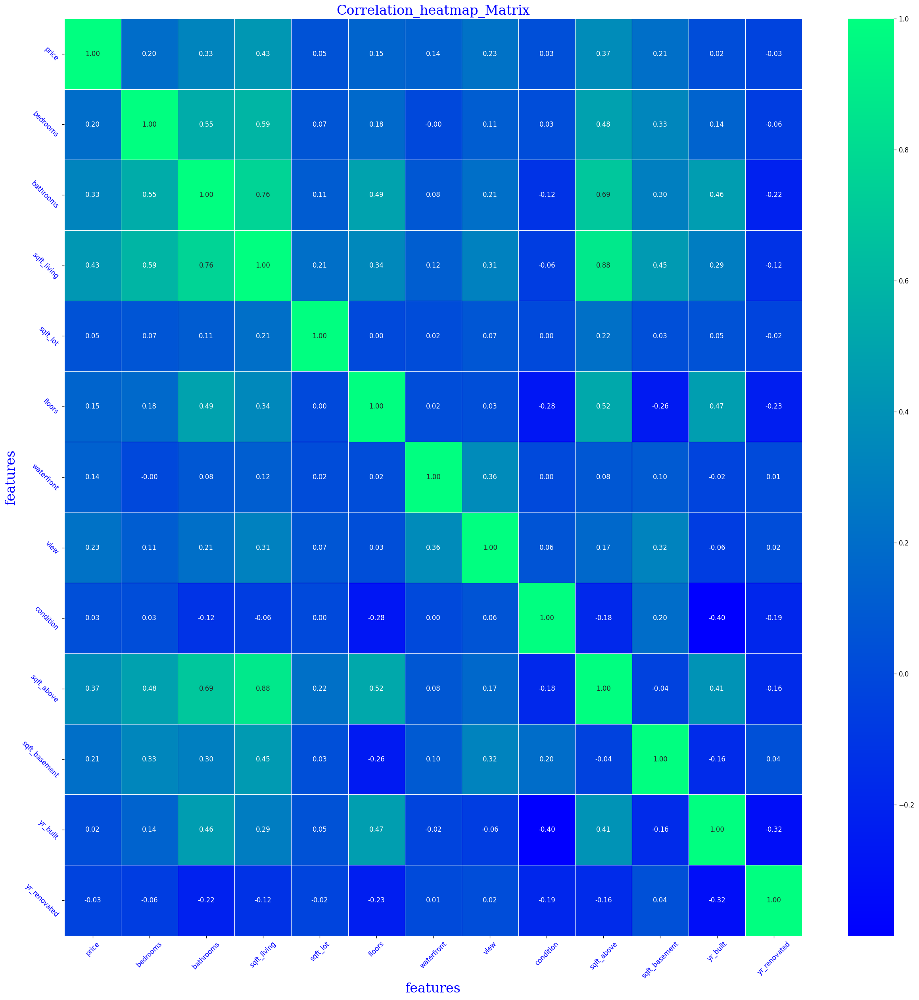

In [20]:
# plot the heatmap:
# plot the heatmap_Correlation_MatRix:
f1={"family":"serif","size":20,"color":"b"}
plt.figure(figsize=(25,25),dpi=120)
sns.heatmap(data.select_dtypes("number").corr(),annot=True,fmt="0.2f",cmap='winter',linewidths=0.5)
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.xlabel("features",fontdict=f1)
plt.ylabel("features",fontdict=f1)
plt.title("Correlation_heatmap_Matrix",fontdict=f1)

## Defination Outliers :

In [21]:
# found many feature contain the outliers  :
features=data.select_dtypes(include="number").columns

for col in features:
    Q1_col,Q3_col=data[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in data[col]:
         if ((x> upper_limit) or (x<low_limit)):
             outlier.append(x)
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")

    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)}")
    print("-"*25)

Ther outlier in this feature price

Q1 of price --->>> 322875.0 

 Q3 of price ---->>> 654962.5 

 iqr--->>332087.5

 low_limit--->>>-175256.25 

  upper_limit--->>> 1153093.75 

 outlier---->>> [2384000.0, 1400000.0, 1200000.0, 1395000.0, 2280000.0, 1425000.0, 1225000.0, 1580000.0, 1870000.0, 1800000.0, 3200000.0, 1500000.0, 1340000.0, 1532500.0, 1750000.0, 1500000.0, 1307000.0, 1250000.0, 2400000.0, 1370000.0, 1157200.0, 1702500.0, 2238888.0, 1225000.0, 1200000.0, 1575000.0, 1315000.0, 1300000.0, 1346400.0, 1225000.0, 1264000.0, 1895000.0, 2555000.0, 1550000.0, 1400000.0, 1680000.0, 1400000.0, 1222500.0, 1255000.0, 2100000.0, 2000000.0, 1270000.0, 1216000.0, 1405000.0, 1190000.0, 1300000.0, 1212500.0, 1275000.0, 1800000.0, 1690000.0, 1506000.0, 1580000.0, 1220000.0, 1185000.0, 1550000.0, 2700000.0, 1600000.0, 1170000.0, 1180500.0, 2150000.0, 1325000.0, 1610000.0, 1200000.0, 2000000.0, 1680000.0, 1570000.0, 1795000.0, 1655000.0, 1381000.0, 1600000.0, 1710000.0, 1285000.0, 1175000.0, 1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


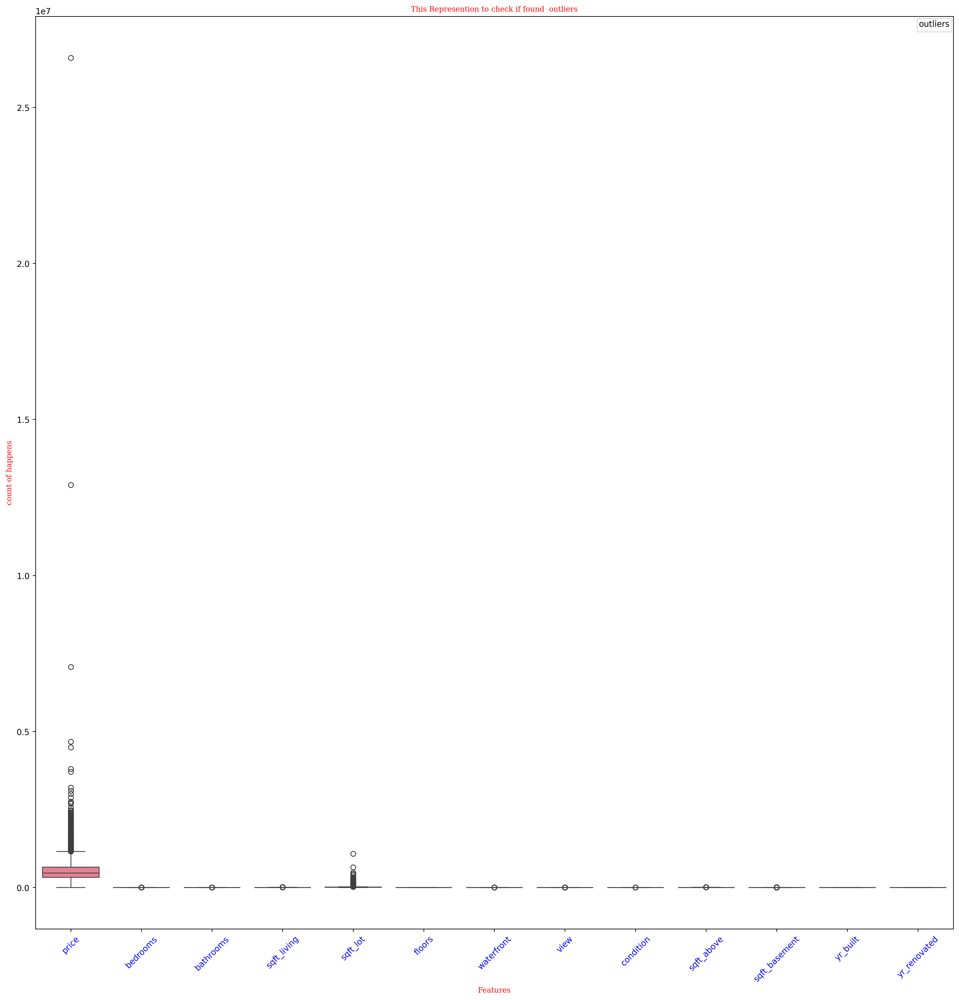

In [22]:
# from this Represention we discover that we found outliers :
f1={"family":"serif","size":9,"color":"r"}
plt.figure(figsize=(20,20),dpi=250)
plt.title("This Represention to check if found  outliers",fontdict=f1)
plt.xlabel("Features",fontdict=f1)
plt.ylabel("count of happens",fontdict=f1)
plt.xticks(rotation=45,color="b")
sns.boxplot(data[features])
plt.legend(title="outliers",prop={'size': 5})

upper_limit :  2243467.0961146383

lower_limit :  -1139541.1191682098

Mean Value :  551962.9884732141

Median Value :  460943.46153850004

1st Standard Deviation :  563834.7025471414


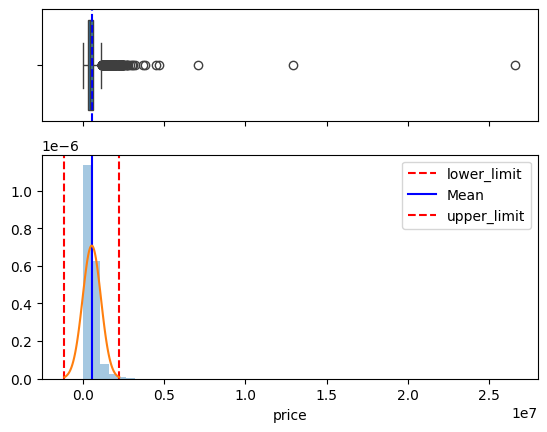

In [23]:
#calculate outlier on price feature:-
# We can see that Distibution in this feature follow Standard Normal Distribution N -> (0,1)

from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.5, 1)})

mean=data.price.mean()
std = data.price.std()
median = data.price.median()
upper_limit = mean + std*3
lower_limit = mean - std*3
print("upper_limit : ", upper_limit)
print("lower_limit : ",lower_limit)

sns.boxplot(x=data["price"], ax=ax_box)
ax_box.axvline(mean, color='b', linestyle='--')


sns.distplot(data["price"], ax=ax_hist,kde=False,norm_hist=True)
ax_hist.axvline(lower_limit, color='r', linestyle='--')
ax_hist.axvline(mean, color='b', linestyle='-')
ax_hist.axvline(upper_limit, color='r', linestyle='--')



plt.legend({'Mean':mean})

ax_box.set(xlabel='')

x = np.linspace(mean - 3*std, mean + 3*std, 100)
plt.plot(x, norm.pdf(x, mean, std))
plt.legend({"lower_limit":lower_limit,'Mean':mean,'upper_limit':upper_limit})
print("Mean Value : ",mean)
print("Median Value : ",median)
print("1st Standard Deviation : ",std)

plt.show()

upper_limit :  6.1274139117948465

lower_limit :  0.6743252186399356

Mean Value :  3.4008695652173913

Median Value :  3.0

1st Standard Deviation :  0.9088481155258186


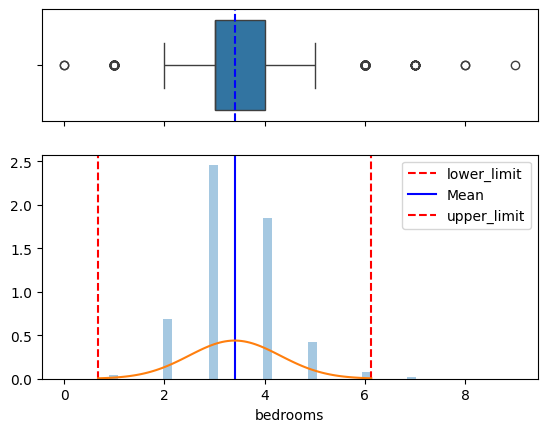

In [24]:
#calculate outlier on bedrooms feature:-
# We can see that Distibution in this feature follow Standard Normal Distribution N -> (0,1)

from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.5, 1)})

mean=data.bedrooms.mean()
std = data.bedrooms.std()
median = data.bedrooms.median()
upper_limit = mean + std*3
lower_limit = mean - std*3
print("upper_limit : ", upper_limit)
print("lower_limit : ",lower_limit)

sns.boxplot(x=data["bedrooms"], ax=ax_box)
ax_box.axvline(mean, color='b', linestyle='--')


sns.distplot(data["bedrooms"], ax=ax_hist,kde=False,norm_hist=True)
ax_hist.axvline(lower_limit, color='r', linestyle='--')
ax_hist.axvline(mean, color='b', linestyle='-')
ax_hist.axvline(upper_limit, color='r', linestyle='--')



plt.legend({'Mean':mean})

ax_box.set(xlabel='')

x = np.linspace(mean - 3*std, mean + 3*std, 100)
plt.plot(x, norm.pdf(x, mean, std))
plt.legend({"lower_limit":lower_limit,'Mean':mean,'upper_limit':upper_limit})
print("Mean Value : ",mean)
print("Median Value : ",median)
print("1st Standard Deviation : ",std)

plt.show()

## Visualization :

city

Snoqualmie Pass       2006.000000

Beaux Arts Village    1988.000000

Lake Forest Park      1276.611111

Tukwila               1241.655172

Shoreline             1215.959350

Burien                1183.945946

Des Moines            1137.051724

Normandy Park         1107.722222

Black Diamond         1107.333333

Clyde Hill            1092.000000

Name: yr_renovated, dtype: float64


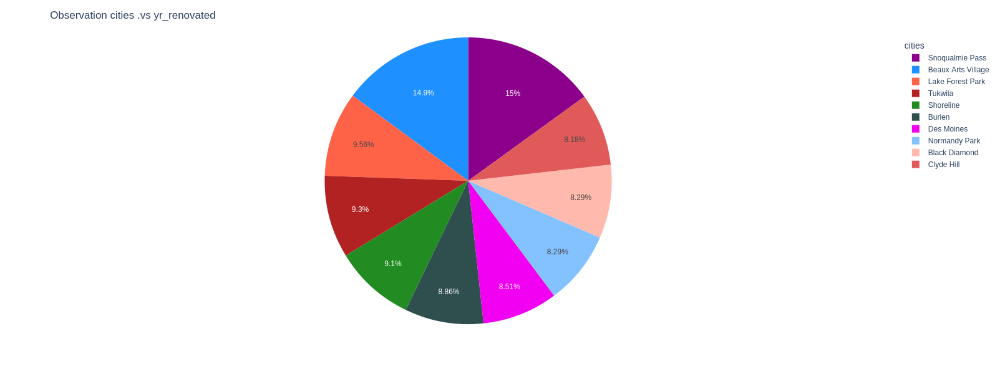

city

Vashon           0.241379

Mercer Island    0.058140

Normandy Park    0.055556

Burien           0.040541

Des Moines       0.034483

Sammamish        0.017143

Redmond          0.008511

Bellevue         0.006993

Federal Way      0.006757

Issaquah         0.005348

Name: waterfront, dtype: float64


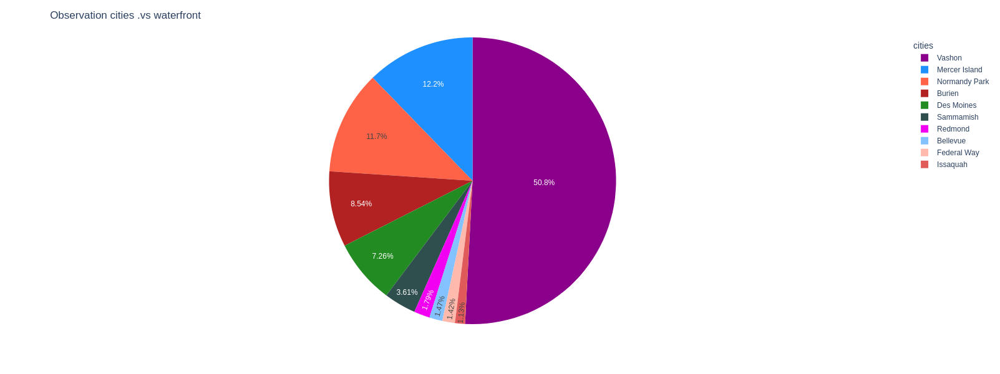

In [25]:
color_palette = ['#8B008B', '#1E90FF', '#FF6347', '#B22222', '#228B22', '#2F4F4F']
# selected the highest 10 cities from yr_renovated   :

top_10 = data.groupby("city")["yr_renovated"].mean().sort_values(ascending=False).head(10)

# Display the top 10 cityies

print(top_10)

top_10_df = top_10.reset_index()
fig = px.pie(top_10_df, names='city', values='yr_renovated', color_discrete_sequence=color_palette)

fig.update_layout(
    title="Observation cities .vs yr_renovated",
    legend_title="cities",
    width=800,  
    height=600  
         )
# Show the plot
fig.show()

# selected the highest 10 cities from waterfront   :

top_10 = data.groupby("city")["waterfront"].mean().sort_values(ascending=False).head(10)

# Display the top 10 cityies

print(top_10)

top_10_df = top_10.reset_index()
fig = px.pie(top_10_df, names='city', values='waterfront', color_discrete_sequence=color_palette)

fig.update_layout(
    title="Observation cities .vs waterfront",
    legend_title="cities",
    width=800,  
    height=600  
         )
# Show the plot
fig.show()

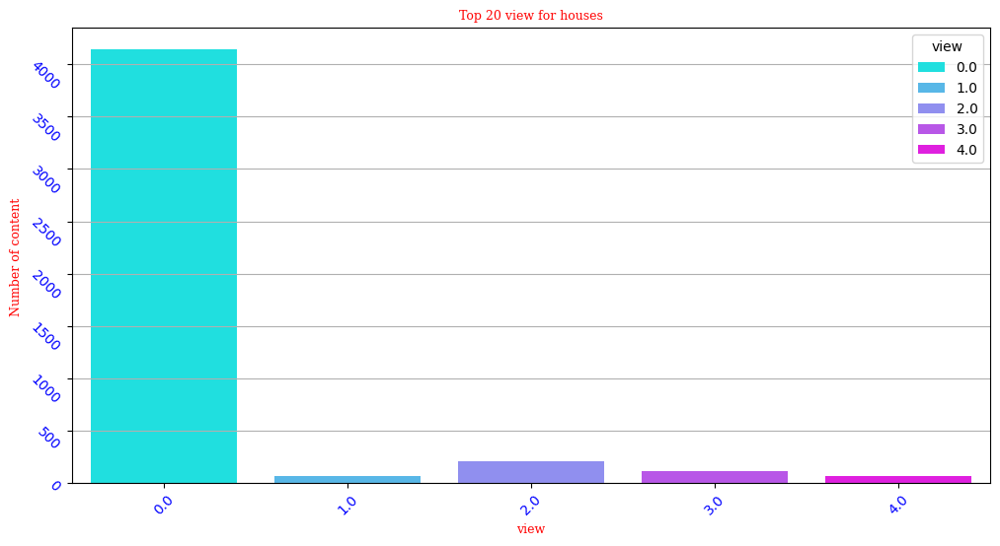

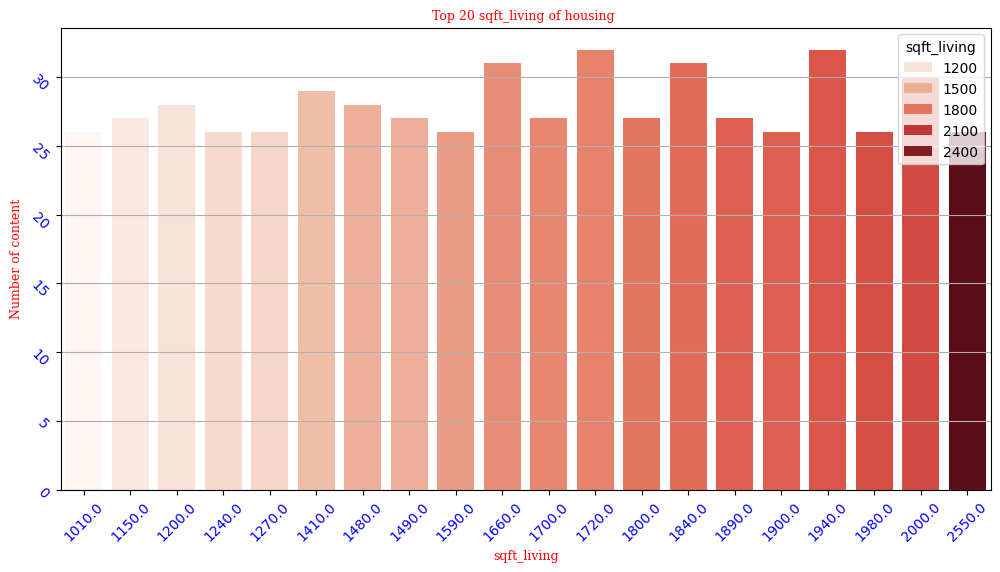

In [26]:
# plot the heighst 20 cities from views :

top_countries = data['view'].value_counts().head(20)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_countries.index, y=top_countries.values,hue=top_countries.index,palette="cool")
plt.title('Top 20 view for houses',fontdict=f1)
plt.xlabel('view',fontdict=f1)
plt.ylabel('Number of content ',fontdict=f1)
plt.grid(True, axis='y')
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.show()

#plot the top 20 cities from the sqft_living :

top_milk = data['sqft_living'].value_counts().head(20)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_milk.index, y=top_milk.values,hue=top_milk.index,palette="Reds")
plt.title('Top 20 sqft_living of housing ',fontdict=f1)
plt.xlabel('sqft_living',fontdict=f1)
plt.ylabel('Number of content',fontdict=f1)
plt.grid(True, axis='y')
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.show()


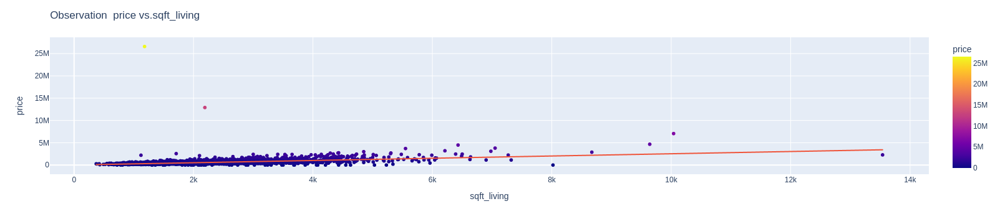

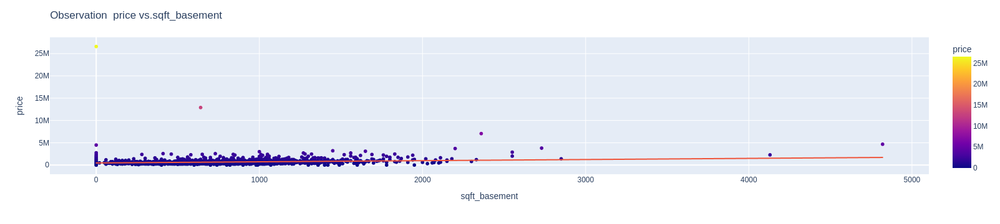

In [27]:
# Observation  price vs.sqft_living (scatterplot) positve Relationship :

fig = px.scatter(data, x='sqft_living', y='price', color='price', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Observation  price vs.sqft_living", xaxis_title="sqft_living", yaxis_title="price")
fig.show()

# Observation  price vs.sqft_basement (scatterplot) positve Relationship :

fig = px.scatter(data, x='sqft_basement', y='price', color='price', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Observation  price vs.sqft_basement", xaxis_title="sqft_basement", yaxis_title="price")
fig.show()


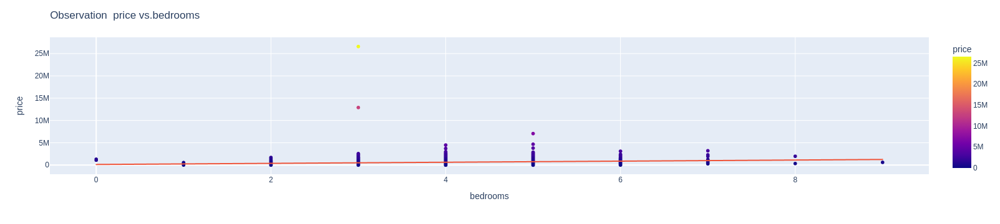

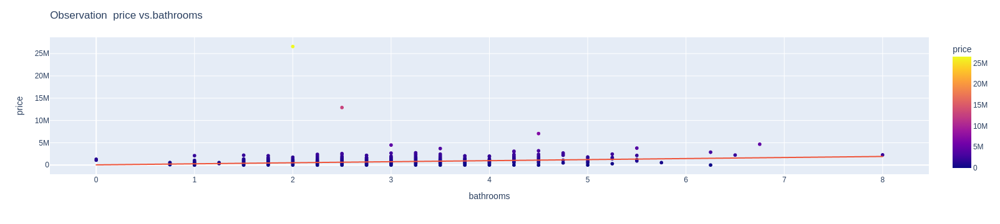

In [28]:
# Observation  price vs.bedrooms (scatterplot) positve Relationship :

fig = px.scatter(data, x='bedrooms', y='price', color='price', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Observation  price vs.bedrooms", xaxis_title="bedrooms", yaxis_title="price")
fig.show()

# Observation  price vs.bathrooms (scatterplot) positve Relationship :

fig = px.scatter(data, x='bathrooms', y='price', color='price', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Observation  price vs.bathrooms", xaxis_title="bathrooms", yaxis_title="price")
fig.show()



## Waffle Visualization :














<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; i Make Waffle observation to see which feature that Controlled on other Features . </p> 

<p> &bull; i found Glucose Feature controled on other features .</p> 

<p> &bull; Finally , PRICE Feature : is the most important Feature in the Data   .</p> 


</div>

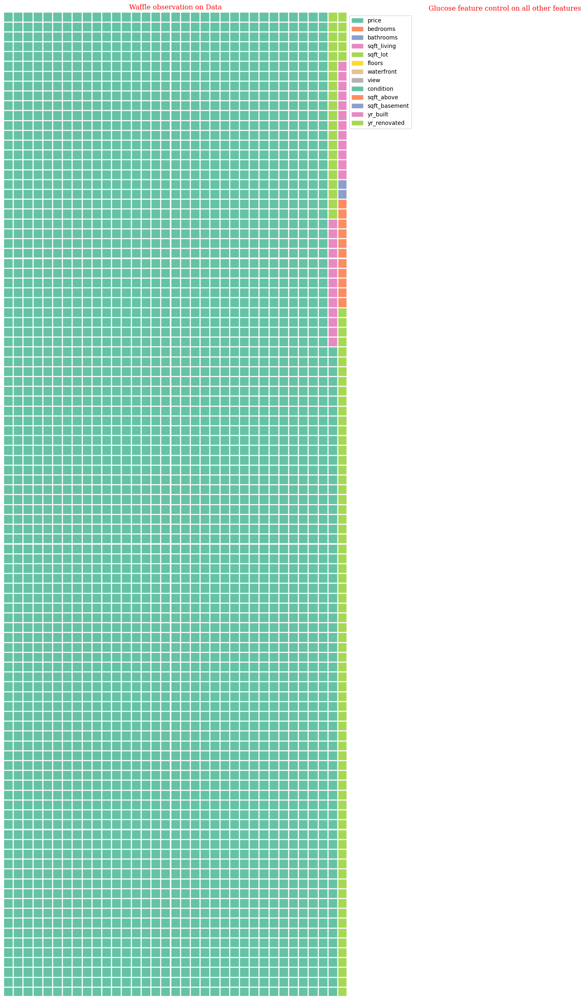

In [29]:
# Make a waffel for the Data:
# from this waffle i see which Feature is a controled on other features : 


f2 = {"family": "serif", "size": 12, "color": "r"}

from pywaffle import Waffle

numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
values = data[numeric_columns].sum().tolist()

fig = plt.figure(
    FigureClass=Waffle,
    rows=100,
    columns=35,
    values=values,
    legend={'labels': numeric_columns.tolist(),
            'loc': "upper left",
            'bbox_to_anchor': (1, 1)},
    figsize=(25, 25)
)
plt.title("Waffle observation on Data",fontdict=f2)
plt.suptitle("Glucose feature control on all other features ",fontdict=f2)
plt.show()

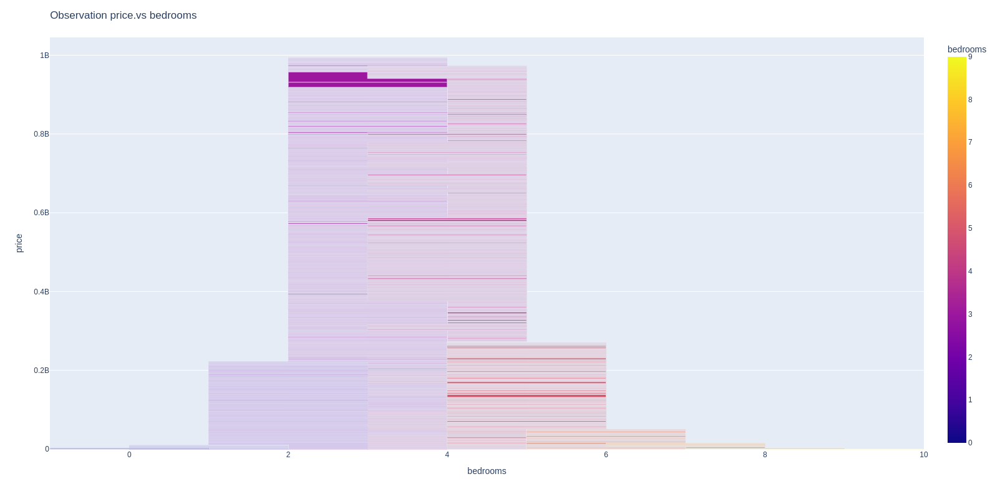

In [30]:
# price.vs bedrooms : 

color_palette = ['#8B008B', '#1E90FF', '#FF6347', '#B22222', '#228B22', '#2F4F4F']
fig = px.bar(data, x='bedrooms', y='price', color='bedrooms', color_discrete_sequence=color_palette)
fig.update_layout(
       title="Observation price.vs bedrooms  ", 
       
       xaxis_title="bedrooms",
    
        yaxis_title="price",
        width=1200,
       height=800,
       barmode='group')

# Update the bar width
fig.update_traces(width=2)
fig.show()


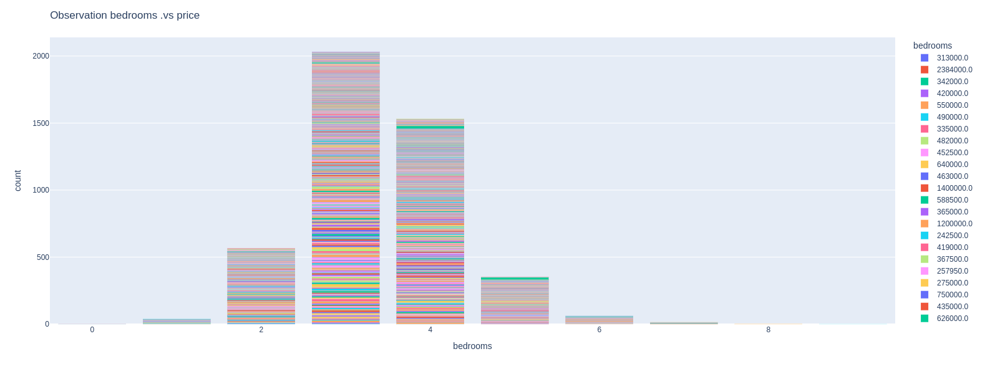

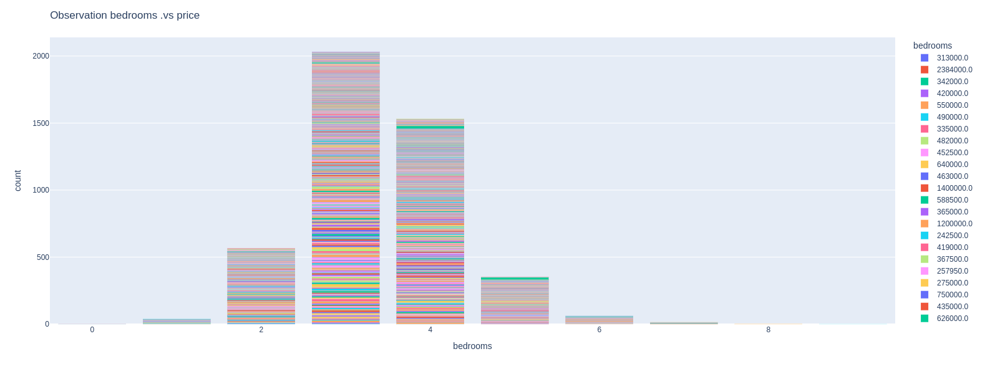

In [31]:
# Histogram that show how bedrooms feature liked with price :
fig = px.histogram(data, x="bedrooms", color="price")
fig.update_layout(
    bargap=0.2,
    title="Observation bedrooms .vs price",
    legend_title="bedrooms",
    width=800,  
    height=600  
)
fig.show()

# Here also you can see how bedrooms feature liked with price 
fig = px.histogram(data, x="bedrooms", color="price")
fig.update_layout(
    bargap=0.2,
    title="Observation bedrooms .vs price",
    legend_title="bedrooms",
    width=800,  
    height=600  
)
fig.show()


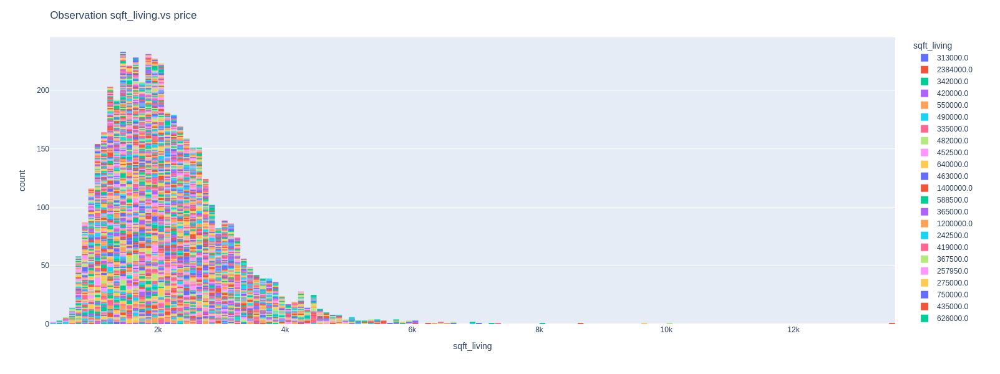

In [32]:
fig = px.histogram(data, x="sqft_living", color="price")
fig.update_layout(
    bargap=0.1,
    title="Observation sqft_living.vs price",
    legend_title="sqft_living",
    width=800,  
    height=600  
)
fig.show()


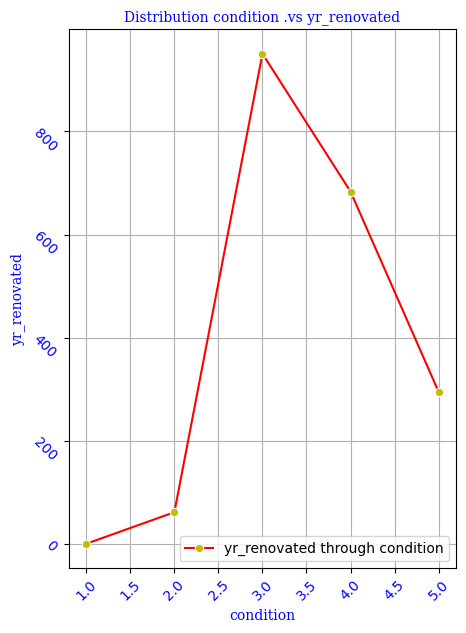

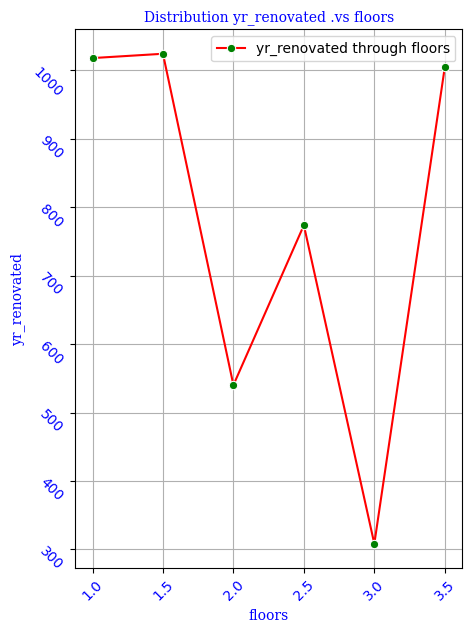

In [33]:
# observation  condition .vs yr_renovated

f2={"family":"serif","size":10,"color":"b"}
plt.figure(figsize=(5,7))
plt.title("Distribution condition .vs yr_renovated",fontdict=f2)

top1=data.groupby("condition")["yr_renovated"].mean().sort_values(ascending=False).head(10)
sns.lineplot(x=top1.index,y=top1.values,color="r",marker="o",mfc="y",label="yr_renovated through condition")

plt.xticks(rotation=45,color="b")
plt.xlabel("condition",fontdict=f2)
plt.ylabel("yr_renovated",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()


# Distribution yr_renovated .vs floors :


plt.figure(figsize=(5,7))
plt.title("Distribution yr_renovated .vs floors",fontdict=f2)

top1=data.groupby("floors")["yr_renovated"].mean().sort_values(ascending=False).head(10)
sns.lineplot(x=top1.index,y=top1.values,color="r",marker="o",mfc="g",label="yr_renovated through floors")

plt.xticks(rotation=45,color="b")
plt.xlabel("floors",fontdict=f2)
plt.ylabel("yr_renovated",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()


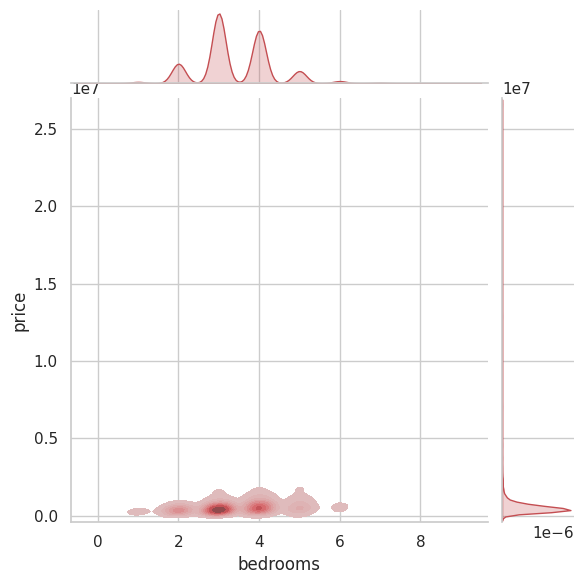

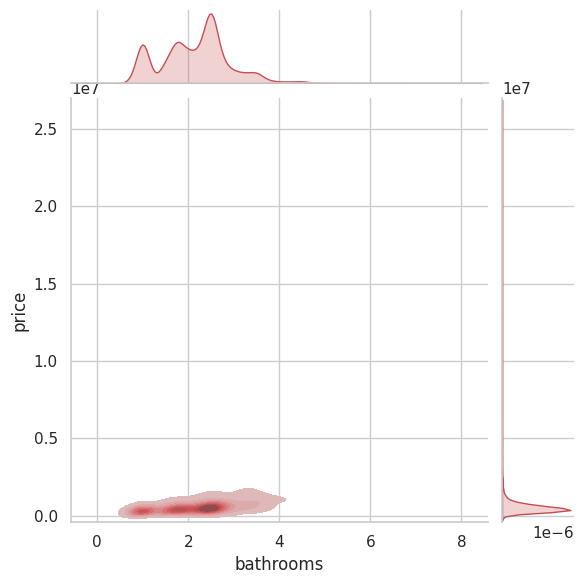

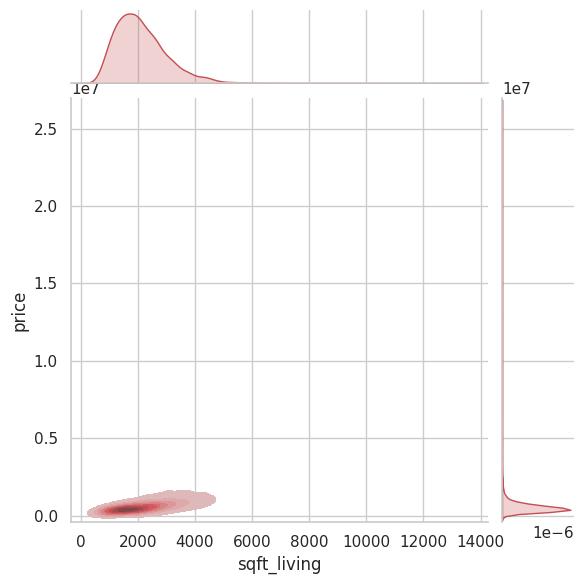

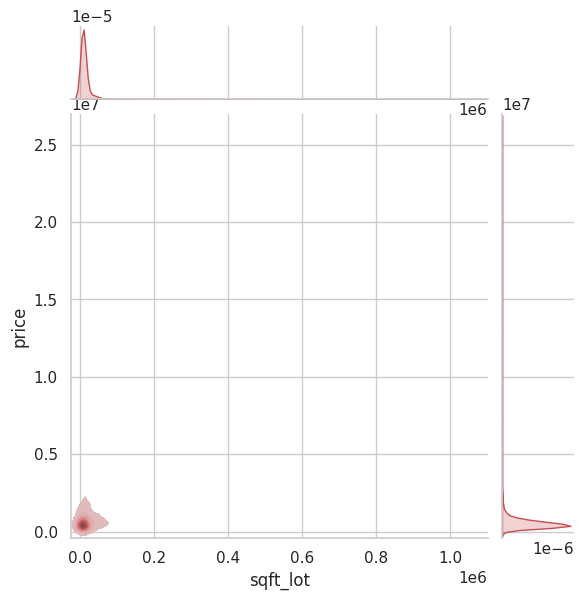

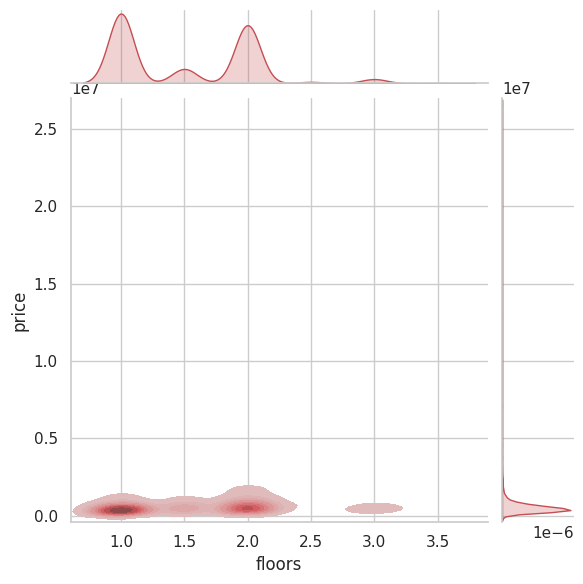

...

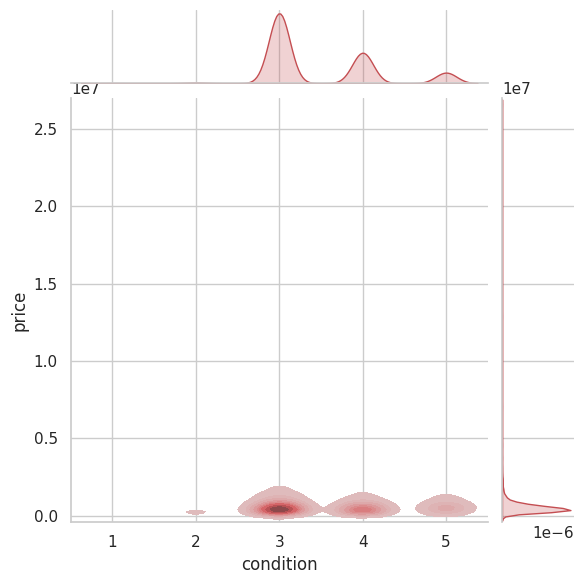

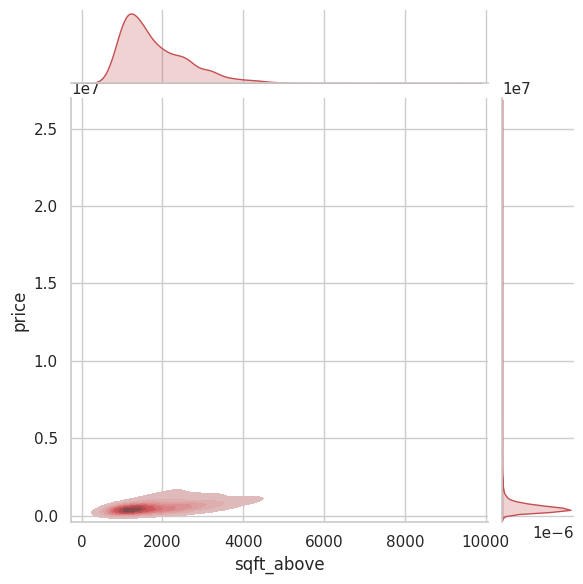

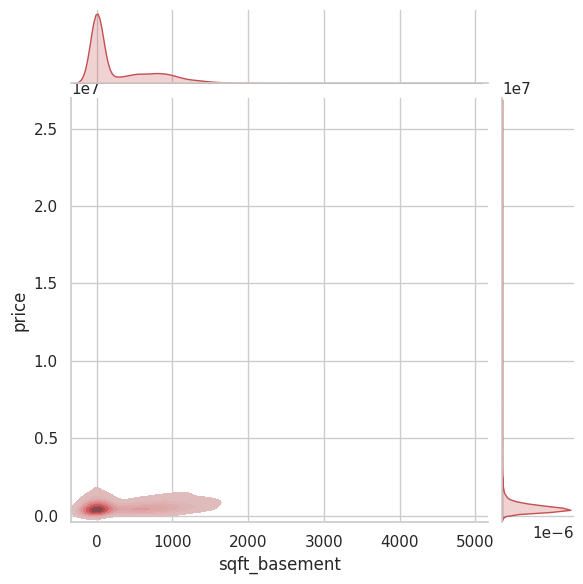

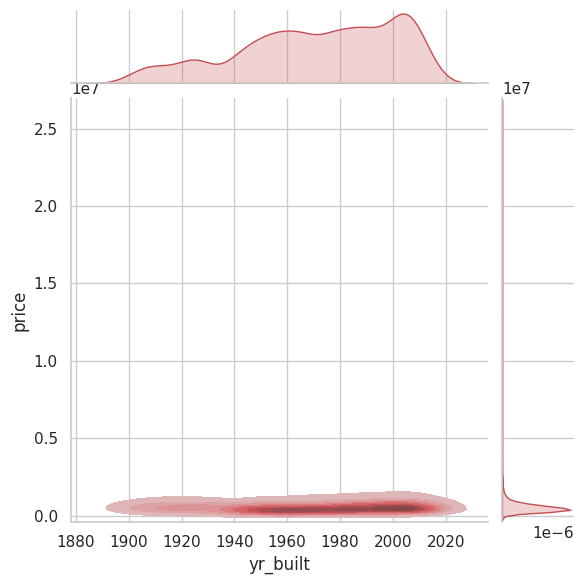

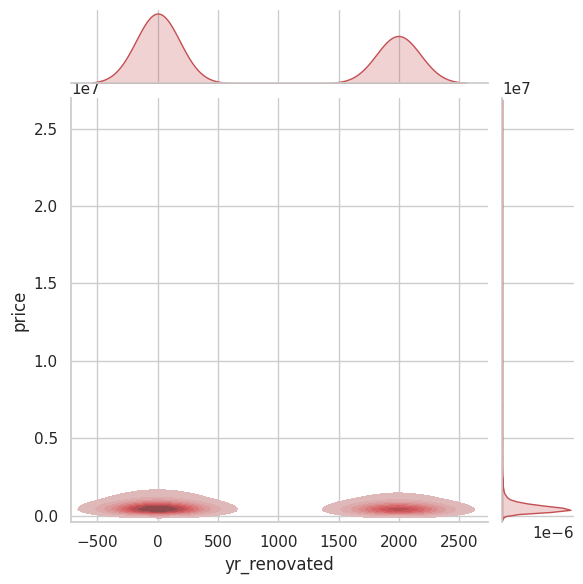

In [34]:
for col in data.select_dtypes("number"):
    if col !="price":
       with sns.axes_style("white"):
           sns.set(style="whitegrid")  # Set the plot style
           sns.set_palette("coolwarm")    # Set the color palette
           sns.jointplot(x=data[col],y=data["price"],kind="kde",fill=True,color="r")

array([[<Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'bedrooms'}>,
        <Axes: title={'center': 'bathrooms'}>,
        <Axes: title={'center': 'sqft_living'}>],
       [<Axes: title={'center': 'sqft_lot'}>,
        <Axes: title={'center': 'floors'}>,
        <Axes: title={'center': 'waterfront'}>,
        <Axes: title={'center': 'view'}>],
       [<Axes: title={'center': 'condition'}>,
        <Axes: title={'center': 'sqft_above'}>,
        <Axes: title={'center': 'sqft_basement'}>,
        <Axes: title={'center': 'yr_built'}>],
       [<Axes: title={'center': 'yr_renovated'}>, <Axes: >, <Axes: >,
        <Axes: >]], dtype=object)

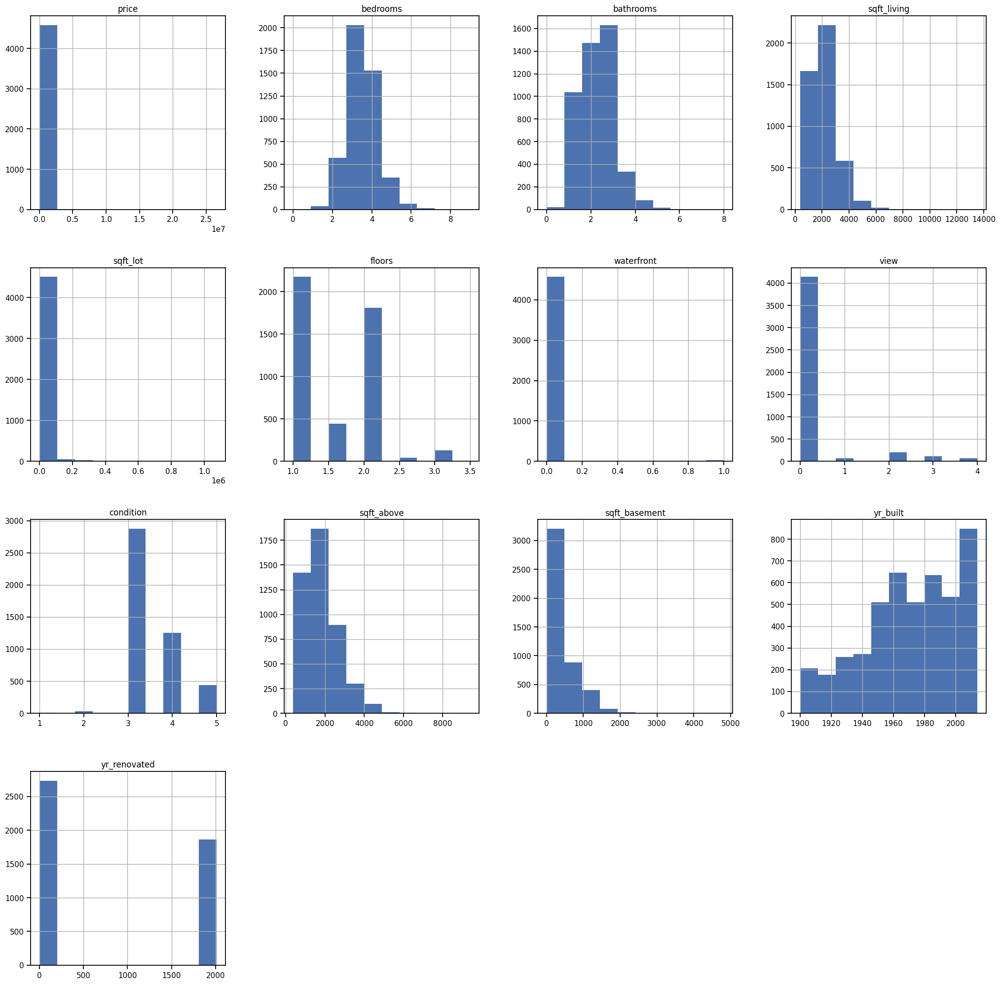

In [35]:
# plot the histgram:
data.hist(figsize=(25,25),color="b")

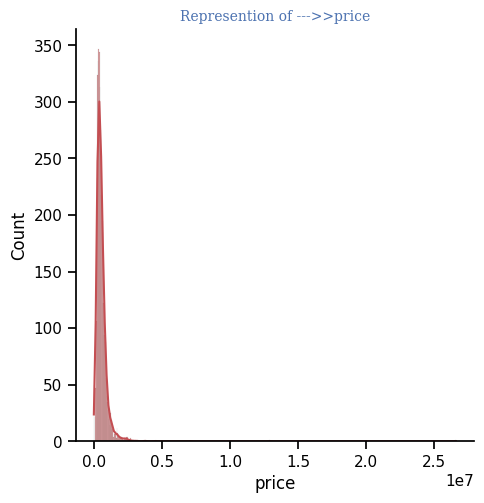

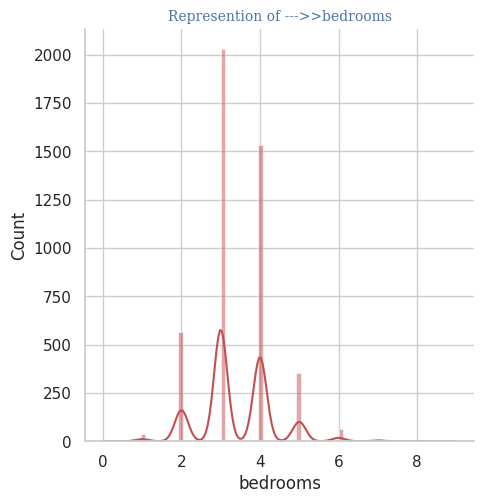

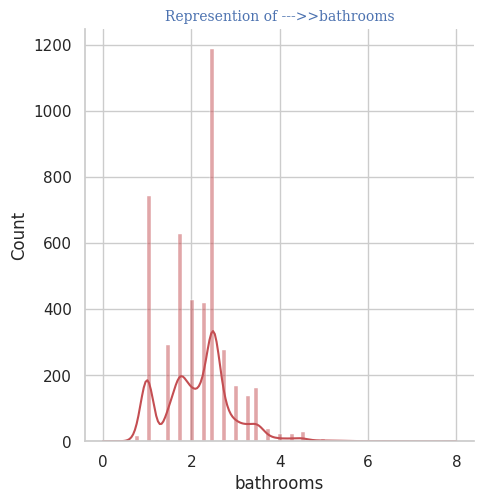

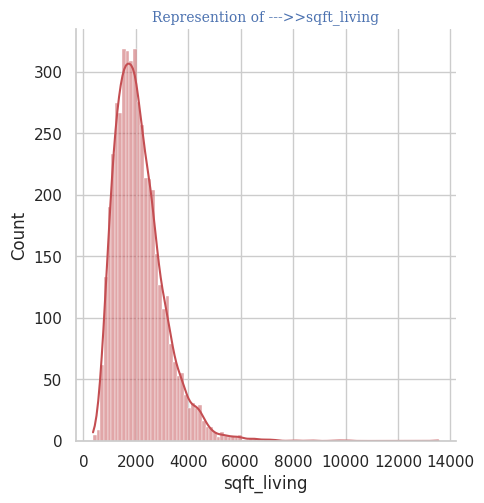

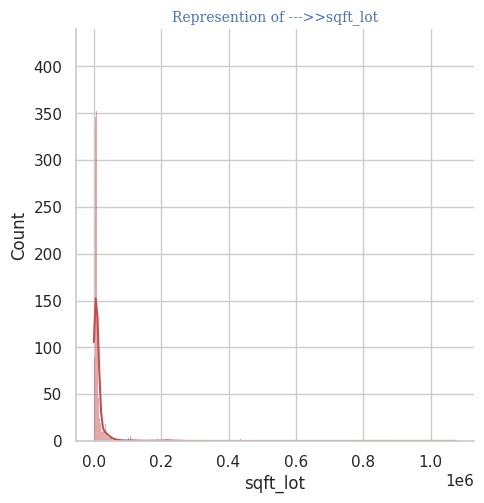

...

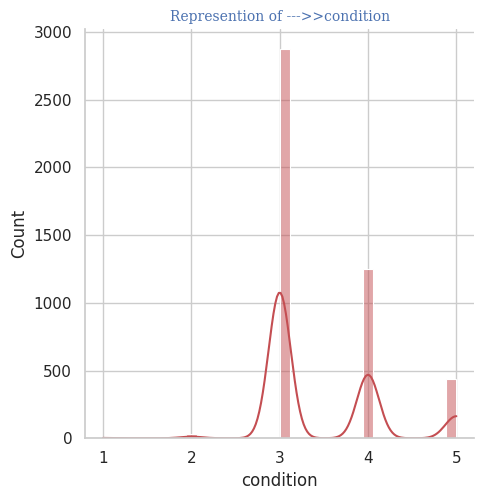

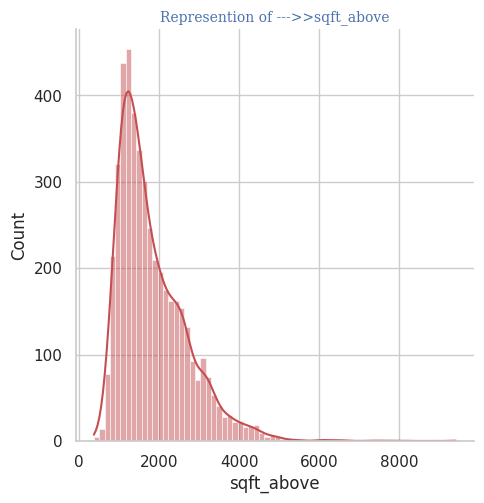

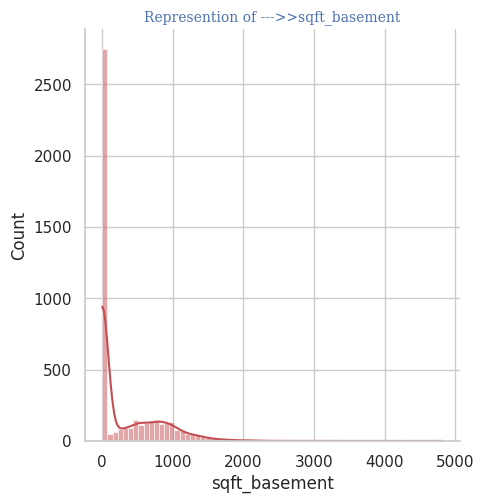

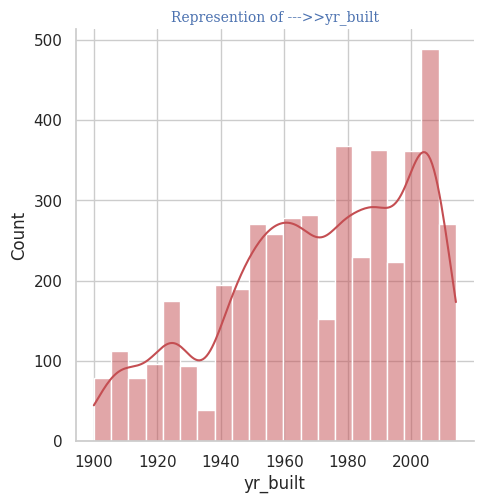

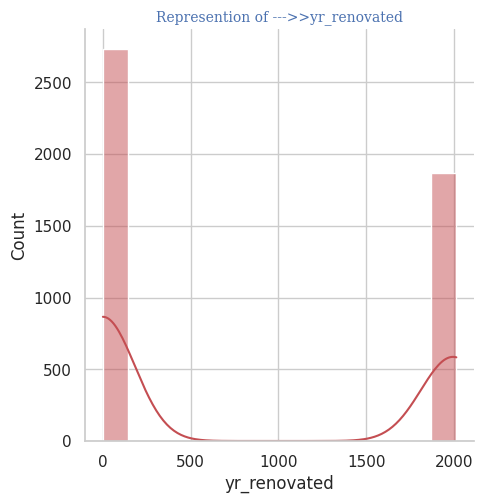

In [36]:
for col in data.select_dtypes(include="float64").columns:
    sns.displot(data[col],kde=True,color="r",label=col)
    sns.set(style="whitegrid")  # Set the plot style
    sns.set_palette("coolwarm")    # Set the color palette
    plt.title("Represention of --->>"+col,fontdict=f2)

<Figure size 6250x6250 with 0 Axes>

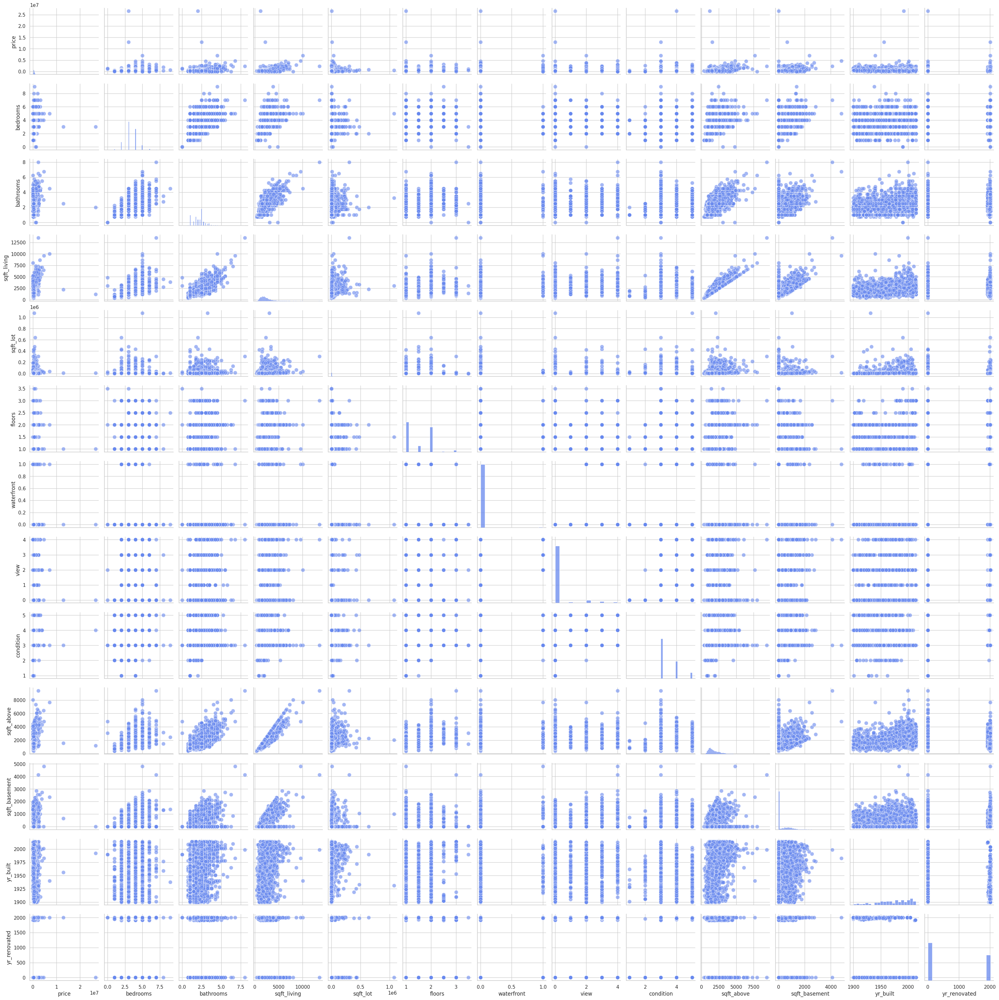

In [37]:
# observe for the float_data
plt.figure(figsize=(25, 25), dpi=250)
sns.set(style="whitegrid")  # Set the plot style
sns.set_palette("coolwarm")    # Set the color palette
sns.pairplot(data.select_dtypes(include='float64'), plot_kws={'alpha': 0.6, 's': 80})

## Split Data for Regression :


<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; i split data into x_reg & y_cly_regass </p> 

<p> &bull; x_reg : refer into all Data Except Target (Price)</p> 

<p> &bull; y_reg : refer into Target (Price)</p> 

<p> &bull; then , iused train_test_split method to divide data into test , train</p> 
</div>


In [38]:
# split the data int train & test :

x_reg, y_reg = make_regression()
x_reg=data.drop(columns="price",axis=1)
y_reg=data["price"]

In [39]:
# train split of the Data
x_train,x_test,y_train,y_test=train_test_split(x_reg,y_reg,test_size=0.3,random_state=42)
print("x_train shape : ",x_train.shape)
print("x_test shape : ",x_test.shape)
print("y_train shape : ",y_train.shape)
print("y_test shape : ",y_test.shape)

x_train shape :  (3220, 17)

x_test shape :  (1380, 17)

y_train shape :  (3220,)

y_test shape :  (1380,)


## Data Processing :







<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p>&bull; I used pipline method to make strong structure for processing for both scaler , labelEncoder & Onehot  </p>
<p> &bull; i used OneHotEncoder  method from to convert any object/Categorical data into Numerical </p> 

<p> &bull; Also i used Standard Scaler on this Data</p> 



## Create processing pipeline :

In [40]:
# Define the numeric features and categorical features
categorical_features =x_train.select_dtypes("object").columns
numeric_features = x_train.select_dtypes("number").columns

# Print the features to ensure they are correctly identified
print("Categorical Features:", categorical_features)
print("Numeric Features:", numeric_features)

# Create preprocessing pipelines for both numeric and categorical data
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

 

Categorical Features: Index(['date', 'street', 'city', 'statezip', 'country'], dtype='object')

Numeric Features: Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',

       'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement',

       'yr_built', 'yr_renovated'],

      dtype='object')


## Bulding Regression models :

<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; KNeighborsRegressors (KNN)  </p> 

<p> &bull; RandomForestRegressor  </p> 

<p> &bull; DecisionTreeRegressor  </p> 

<p> &bull; linearRegression  </p> 

<p> &bull; gradient boosting regresso  </p>



</div>



In [41]:
## Define the models :

LR=LinearRegression()
DT=DecisionTreeRegressor()
RF=RandomForestRegressor()
KNN=KNeighborsRegressor()
GBR=GradientBoostingRegressor(learning_rate=0.01)


In [42]:
# Create the pipelines for each model

pipeline_knn = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('knn', KNN)
])

pipeline_random_forest = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('random_forest', RF)
])

pipeline_decision_tree = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('decision_tree', DT)
])

pipeline_linear_regression = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('linear_Regression', LR)
])

pipeline_gradient = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('Gradient',GBR)
])



In [43]:
# Train the models using the pipelines

pipeline_knn.fit(x_train, y_train)
pipeline_random_forest.fit(x_train, y_train)
pipeline_decision_tree.fit(x_train, y_train)
pipeline_linear_regression.fit(x_train, y_train)
pipeline_gradient.fit(x_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement',
       'yr_built', 'yr_renovated'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
         

Model: KNeighborsRegressor()

R2 Train Score: 0.7018731493323853

R2 Test Score: 0.0693712617317328

Mean Squared Error of Train: 43022875232.97146

Mean Squared Error of Test: 672334578052.4626


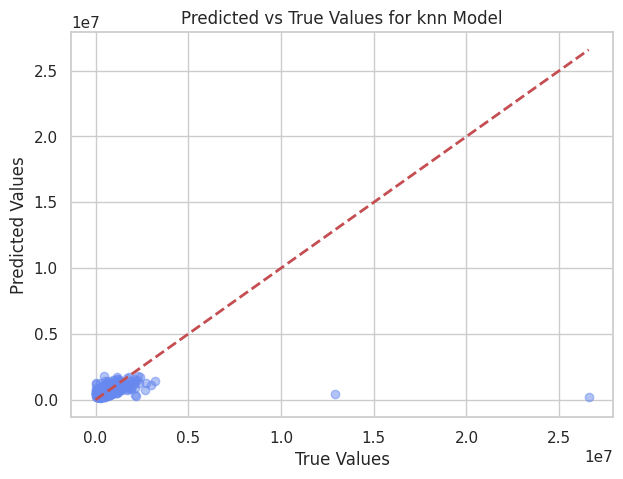

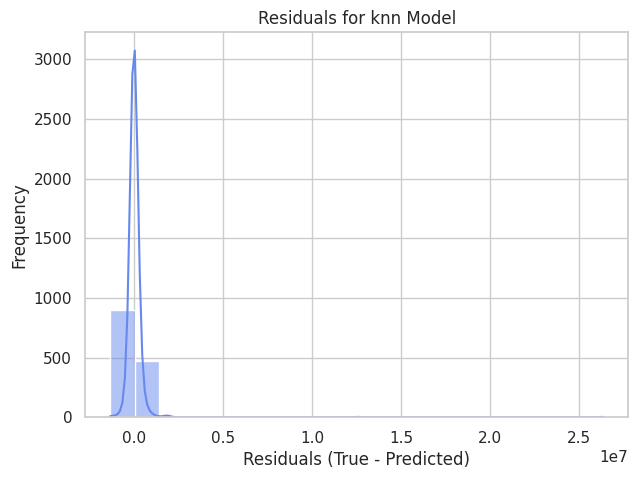

----------------------------------------------------------------------------------------------------

Model: RandomForestRegressor()

R2 Train Score: 0.949170571078977

R2 Test Score: 0.0840825153117346

Mean Squared Error of Train: 7335227181.769296

Mean Squared Error of Test: 661706403720.8398


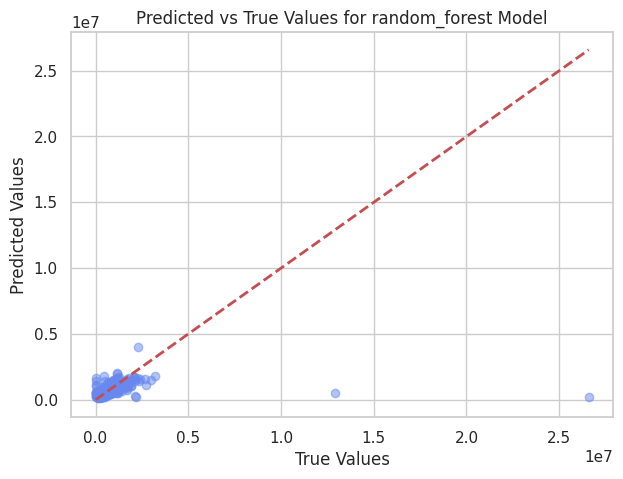

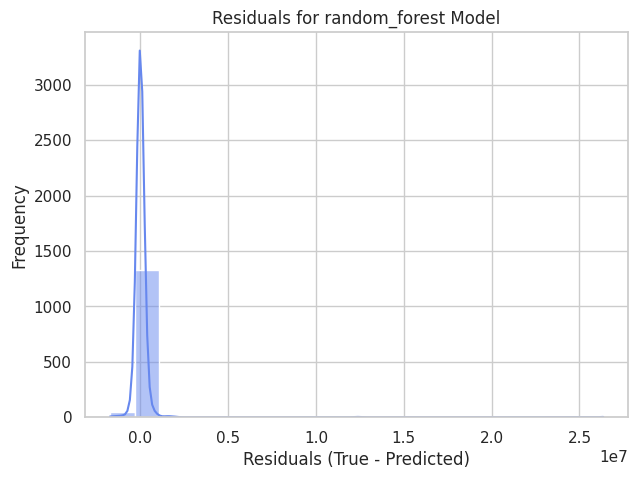

----------------------------------------------------------------------------------------------------

Model: DecisionTreeRegressor()

R2 Train Score: 1.0

R2 Test Score: 0.039494827940223964

Mean Squared Error of Train: 0.0

Mean Squared Error of Test: 693918866911.0946


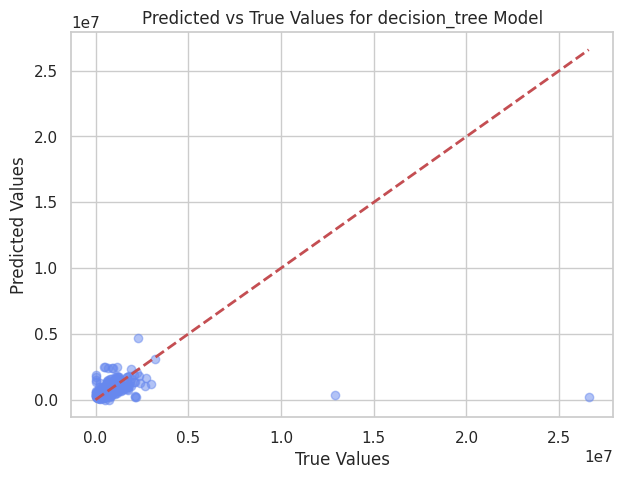

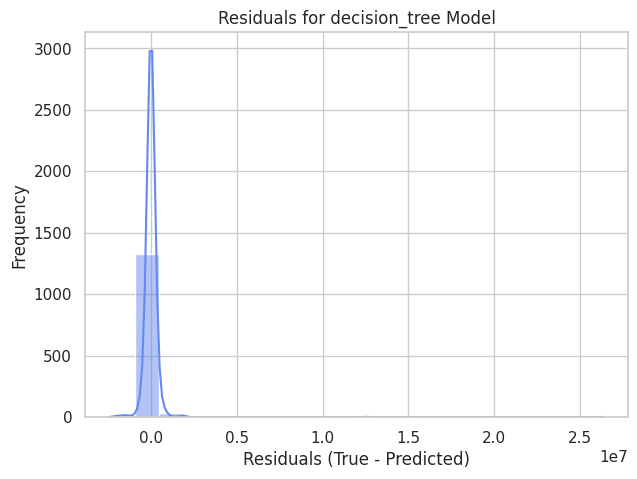

----------------------------------------------------------------------------------------------------

Model: LinearRegression()

R2 Train Score: 0.9999970259618088

R2 Test Score: -0.1558534652319572

Mean Squared Error of Train: 429185.34090327134

Mean Squared Error of Test: 835048628826.234


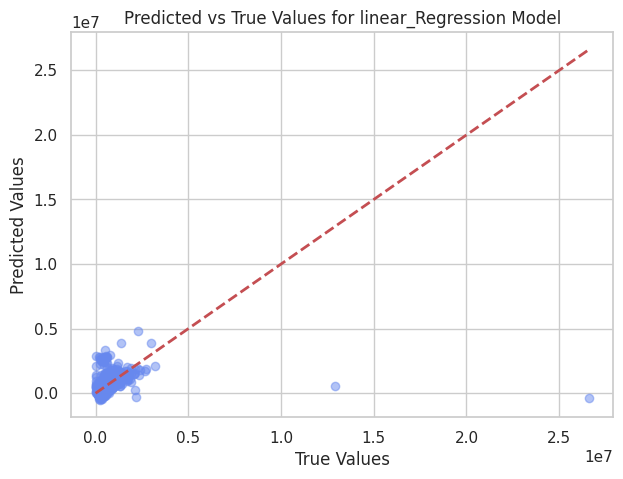

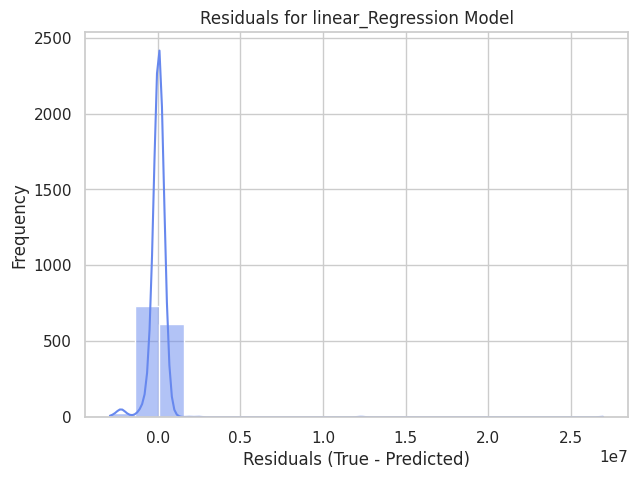

----------------------------------------------------------------------------------------------------

Model: GradientBoostingRegressor(learning_rate=0.01)

R2 Train Score: 0.508420029610305

R2 Test Score: 0.05780625563661679

Mean Squared Error of Train: 70940217849.35815

Mean Squared Error of Test: 680689739647.4106


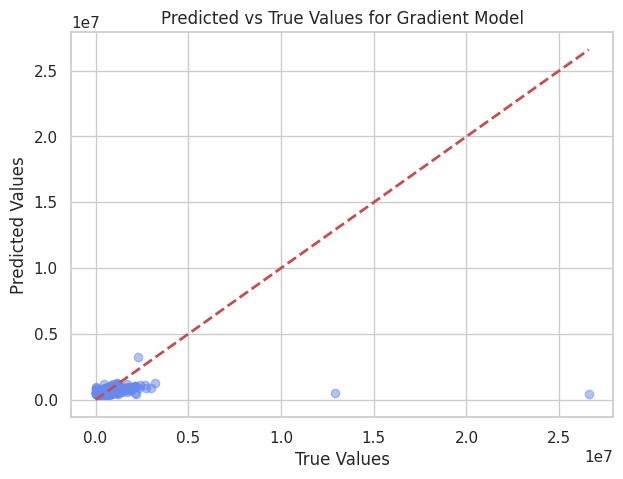

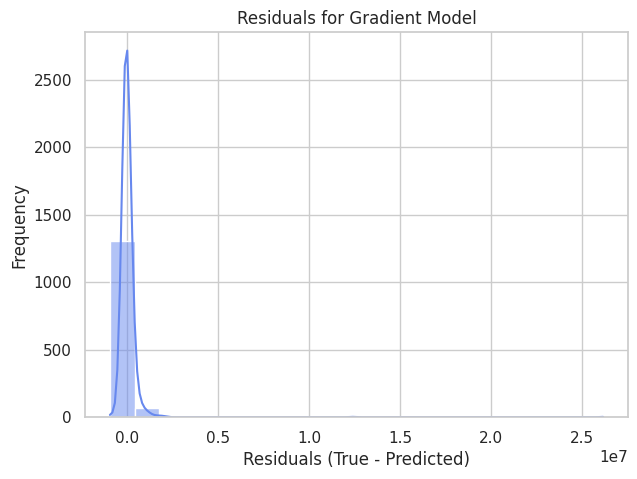

In [44]:
# Define a function to evaluate a regression pipeline

def evaluate_pipeline(pipeline, X_train, X_test, y_train, y_test, sc_y=None):
    y_pred = pipeline.predict(X_test)
    y_train_pred = pipeline.predict(X_train)
    
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    
    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_pred)
    
    if sc_y is not None:
        y_pred = sc_y.inverse_transform(y_pred.reshape(-1, 1))
        y_train_pred = sc_y.inverse_transform(y_train_pred.reshape(-1, 1))
        
        r2_test = r2_score(sc_y.inverse_transform(y_test.reshape(-1, 1)), y_pred)
        mse_test = mean_squared_error(sc_y.inverse_transform(y_test.reshape(-1, 1)), y_pred)
    
    print(f"Model: {pipeline.steps[-1][1]}")
    print("R2 Train Score:", r2_train)
    print("R2 Test Score:", r2_test)
    print("Mean Squared Error of Train:", mse_train)
    print("Mean Squared Error of Test:", mse_test)
    
    # Plot the predicted vs true values
    plt.figure(figsize=(7, 5))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.title(f'Predicted vs True Values for {pipeline.steps[-1][0]} Model')
    plt.show()
    
    # Plot the residuals
    plt.figure(figsize=(7, 5))
    sns.histplot((y_test - y_pred), bins=20, kde=True)
    plt.xlabel('Residuals (True - Predicted)')
    plt.ylabel('Frequency')
    plt.title(f'Residuals for {pipeline.steps[-1][0]} Model')
    plt.show()


evaluate_pipeline(pipeline_knn, x_train, x_test, y_train, y_test)
print("-"*100)
evaluate_pipeline(pipeline_random_forest, x_train, x_test, y_train, y_test)
print("-"*100)
evaluate_pipeline(pipeline_decision_tree, x_train, x_test, y_train, y_test)
print("-"*100)
evaluate_pipeline(pipeline_linear_regression, x_train, x_test, y_train, y_test)
print("-"*100)
evaluate_pipeline(pipeline_gradient, x_train, x_test, y_train, y_test)

## Results :

<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

                             
<p> &bull; Model : LinearRegression  </p> 
<p> &bull; model_accuracy: 0.9999970259618088  </p> 

<p> --------------------------------------------------------------------------------------  </p> 

<p> &bull; Model : DecisionTreeRegressor  </p> 
<p> &bull; model_accuracy:   1.0 </p> 

<p> --------------------------------------------------------------------------------------  </p> 

<p> &bull; Model : RandomForestRegressor  </p> 
<p> &bull; model_accuracy:0.9492400587265168  </p> 

<p> --------------------------------------------------------------------------------------  </p> 

<p> &bull; Model : knn_regressor   </p> 
<p> &bull; model_accuracy: 0.7018731493323853 </p> 

<p> --------------------------------------------------------------------------------------  </p> 

<p> &bull; Model : Gradient_descent_regressor </p> 
<p> &bull; model_accuracy:0.508420029610305 </p> 

<p> --------------------------------------------------------------------------------------  </p> 


</div>

## See the best model :

<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

                             
<p> &bull; At first we known that Every model has Advantages & disadvantages , so we cant say that there are model is the best at all .  </p> 
<p> &bull; but , in this Dataset , we will detect the best model based on : </p> 
<p> &bull; highest R^2 : CoffientDetermination   </p> 
<p> &bull;MSE : lowest mean square Error  </p>
<p> &bull; Comparing  Metrics   </p>
<p> &bull; After Comparing All of these condation the Best model in Traditional Ml-models : LinearRegression </p>



</div>


## save & load the model :

In [45]:
import pickle
with open('model.pkl', 'wb') as file:
    pickle.dump(pipeline_random_forest, file)


with open('model.pkl', 'rb') as file:
    my_object_loaded = pickle.load(file)


print(pipeline_random_forest)


#from joblib import dump, load

#dump(pipeline_random_forest,'model.joblib')

#model = load('model.joblib')


Pipeline(steps=[('preprocessor',

                 ColumnTransformer(transformers=[('num',

                                                  Pipeline(steps=[('imputer',

                                                                   SimpleImputer()),

                                                                  ('scaler',

                                                                   StandardScaler())]),

                                                  Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',

       'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement',

       'yr_built', 'yr_renovated'],

      dtype='object')),

                                                 ('cat',

                                                  Pipeline(steps=[('imputer',

                                                                   SimpleImputer(strategy='most_frequent')),

                                                                  ('oneho

## Conclusion :














<div style="border: 5px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">


    
<p>&bull; in the Conclusion im whish that you could build Regression models , Thank you for following my Notebooks .</p>




<p>&bull; Thank you for reading this notebook! If you found this content useful, please consider giving it an upvote.</p>




<p>&bull; Your support is greatly appreciated! .</p>




<p>&bull; Kaggle: Your Home for Data Science</p>




<p>&bull; <a href="https://www.kaggle.com/abdalrhamnhebishy" target="_blank">Kaggle profile</a>.</p>



<p>&bull;  AbdalRhman Hebishy , DataScientist||Machine learning||Deeplearning Engineer .</p>
   

</div>

<img src="https://morethankyounotes.com/wp-content/uploads/2016/08/Thank-you-for-house-sitting.png" alt="My Image">